In [2]:
# import zipfile
# with zipfile.ZipFile("AID.zip", 'r') as zip_ref:
#     zip_ref.extractall("")

# Introduction

Convolutional Neural Networks (CNNs) have emerged as a powerful and widely used deep learning architecture for image classification and computer vision tasks. Their ability to automatically learn hierarchical representations directly from raw pixel data has revolutionized the field of computer vision, enabling remarkable performance on various challenging tasks.

However, as CNNs become increasingly complex and sophisticated, their inner workings become less transparent, limiting interpretability and understanding of their decision-making process. This lack of interpretability raises concerns about the reliability, fairness, and potential biases embedded within CNN models. It also poses challenges in gaining trust and acceptance from end-users, stakeholders, and regulatory bodies.

To overcome these challenges, researchers and practitioners have delved into the field of model explainability, aiming to shed light on how CNN models make decisions. By gaining insights into the factors influencing CNN predictions, we can better understand the decision-making process, identify potential biases, and ensure accountability.

In this article, we will explore the fascinating world of model explainability in the context of remote sensing classification, specifically for aerial scenic images. We will employ a powerful CNN architecture called ResNet-34, known for its excellent performance and suitability for a wide range of tasks. ResNet-34 utilizes residual connections to alleviate the vanishing gradient problem and allows for deeper network architectures.

To uncover the underlying patterns and features that ResNet-34 analyzes to make classification decisions, we will utilize the Local Interpretable Model-agnostic Explanations (LIME) technique. LIME provides a systematic approach to generating local explanations for individual predictions, allowing us to understand which image regions contribute most significantly to the model's decision-making process.

To implement the ResNet-34 model, LIME, and conduct our experiments, we will utilize PyTorch, a popular and user-friendly deep learning framework. PyTorch provides a comprehensive ecosystem for building, training, and evaluating CNN models, making it an ideal choice for our explorations. Its intuitive interface and extensive documentation enable remote sensing practitioners to easily navigate the world of deep learning.

By leveraging the ResNet-34 model, LIME, and PyTorch, we aim to demystify the inner workings of CNNs, providing remote sensing practitioners with the knowledge and tools necessary for accurate and transparent image classification. Understanding the factors that drive ResNet-34 predictions using LIME not only enhances the reliability and fairness of these models but also empowers practitioners to address critical global challenges, such as climate change monitoring, disaster response, and sustainable development initiatives.

By bridging the gap between complex deep learning models, interpretability through LIME, and the ease of use provided by PyTorch, we take the initial steps towards a more transparent and accountable approach to leveraging CNNs in remote sensing applications. This tutorial, focusing on ResNet-34, LIME, and PyTorch, serves as a vital resource, enabling practitioners to harness the power of these tools to make informed decisions and contribute to global efforts in tackling climate change.

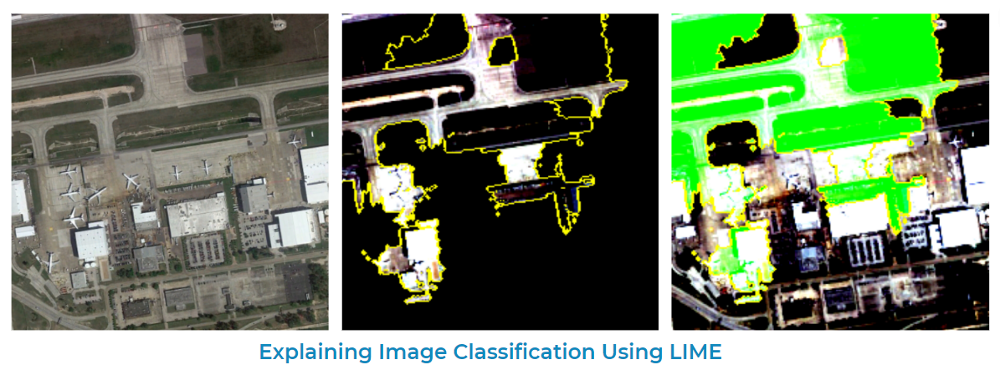

# Configuring the Necessary Python Packages

Make sure to set the environment variables to specify cache directories. In the case where this notebook is run, this is required. This is necessary in situations where you want to customize the location where libraries or frameworks store their cache data. Cache data typically includes temporary files, downloaded files, or any other data that is stored locally for faster access in subsequent operations.

By setting the environment variables, you can override the default cache directory paths and specify a different location that suits your requirements. Take note that path varies depending on the type of environment and setup where your notebook will be run.

In [1]:
import os

# Set the environment variables to specify the cache directories
# for different libraries or frameworks.
os.environ['XDG_CACHE_HOME'] = '/home/msds2023/javila/.cache'
os.environ['HUGGINGFACE_HUB_CACHE'] = '/home/msds2023/javila/.cache'
os.environ['TRANSFORMERS_CACHE'] = '/home/msds2023/javila/.cache'

We need to ensure that we have all of the necessary packages installed. Install the necessary packages by running this line of code in your Jupyter Notebook:

`!pip install --upgrade pandas numpy matplotlib tensorflow torch torchvision lime`

Once the installation is finished, you can proceed with importing the required libraries in your code. Make sure to include the following import statements at the beginning of your code:

In [2]:
import PIL
from PIL import Image
import os, shutil
import numpy as np
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm
import copy
import time

import torch
import torchvision
from torchvision.utils import save_image
from torchvision.transforms.functional import to_tensor
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch import nn, optim
from torchsummary import summary

import lime
from lime import lime_image

Check if you have a GPU and save whatever your device is using in 'device' parameter. The model here was run in Cuda which is a lot better in terms of speed.

In [3]:
# Hoping there is a GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

# Preparation of Data for Training, Validation, and Testing

The dataset used here is an aerial scene image dataset taken from the paper entitled "AID: A Benchmark Dataset for Performance Evaluation of Aerial Scene Classification" and can be downloaded from https://www.kaggle.com/datasets/jiayuanchengala/aid-scene-classification-datasets. The AID dataset has 30 different scene classes and about 200 to 400 samples of size 600x600 in each class. These images were gathered by collecting sample images from Google Earth imagery.

The codes used here were adopted from the notebook of Ms. Mia Desiree Verdeprado in her class for Machine Learning 3 for MSDS 2023. The main purpose of the code is to partition the dataset prepared in the previous section into train, validation, and test sets. The partitioned dataset are saved in their corresponding folders for training, validation, and testing.

In [4]:
def list_files(path):
    """
    Gets the list of folders or files in a directory
    without including the hidden files.
    """
    # Do not include hidden files
    files = [f for f in os.listdir(path) if not f.startswith('.')]
    return files

In [5]:
# This function can be used to copy images to train, validation, and test dirs
def create_dataset(src, dst, range_, class_):
    """Copy images of class class_ within range_ from src to dst.
    
    Parameters
    ----------
    src : str
        source directory
    dst : str
        destination directory
    range_ : tuple
        tuple of min and max image index to copy
    class_ : str
        image class 
    """
    if os.path.exists(dst):
        # if existing, delete dir to reset
        shutil.rmtree(dst)
    os.makedirs(dst)
    fnames_list = list_files(src)
    fnames = [fnames_list[i] for i in range(*range_)]
    for fname in fnames:
        src_file = os.path.join(src, fname)
        dst_file = os.path.join(dst, fname)
        shutil.copyfile(src_file, dst_file)

'path_raw' is the file directory from which the dataset was saved from. In this file path, images are contained in folders with their corresponding class name. On the other hand, 'path_output' is the destination file path within which the test, validation, and training datasets will be partitioned and saved into. 

In [6]:
path_raw = "AID/images"
path_output = "AID"

The next code snippet divides the raw dataset into 60% training data, 20% validation data, and 20% test data.

In [7]:
import math

# looping through create_dataset for each class
# Partition should be as follows
# 60% train data, 20% validation data, 20% test data
classes = sorted(list_files(path_raw))
for class_ in classes:
    src = path_raw # source file
    total_photos = len(list_files(f"{path_raw}/{class_}"))
    
    train_set = math.ceil(total_photos*0.6)
    val_set = int((total_photos -  train_set)*0.5)
    test_set = int(total_photos -  train_set - val_set)
    
    dst = f'{path_output}/dataset/train/{class_}' # train
    create_dataset(src+'/'+class_, dst, range_=(1, train_set+1), class_=class_)

    dst = f'{path_output}/dataset/validation/{class_}' # val
    create_dataset(src+'/'+class_, dst, range_=(train_set+1, train_set+val_set+1), class_=class_)
    
    dst = f'{path_output}/dataset/test/{class_}' # test
    create_dataset(src+'/'+class_, dst, range_=(train_set+val_set+1, total_photos), class_=class_)

We have to check if correct number of images are saved to the necessary folders. We can do this by counting the saved images in each dataset file path for each class.

In [8]:
# Checking of the number of files in each folder
path_dataset = f"{path_output}/dataset"
for data in list_files(path_dataset):
    path_data = f"{path_dataset}/{data}"
    for class_ in list_files(path_data):
        path_class = f"{path_dataset}/{data}/{class_}"
        print(f"total {data} {class_} images:", len(list_files(path_class)))

total train Airport images: 216
total train BareLand images: 186
total train BaseballField images: 132
total train Beach images: 240
total train Bridge images: 216
total train Center images: 156
total train Church images: 144
total train Commercial images: 210
total train DenseResidential images: 246
total train Desert images: 180
total train Farmland images: 222
total train Forest images: 150
total train Industrial images: 234
total train Meadow images: 168
total train MediumResidential images: 174
total train Mountain images: 204
total train Park images: 210
total train Parking images: 234
total train Playground images: 222
total train Pond images: 252
total train Port images: 228
total train RailwayStation images: 156
total train Resort images: 174
total train River images: 246
total train School images: 180
total train SparseResidential images: 180
total train Square images: 198
total train Stadium images: 174
total train StorageTanks images: 216
total train Viaduct images: 252
tot

All 30 aerial scene classes available in the raw dataset were used. The following list shows these 30 classes.

In [9]:
path_test = f"{path_output}/dataset/test"
list_files(path_test)

['Airport',
 'BareLand',
 'BaseballField',
 'Beach',
 'Bridge',
 'Center',
 'Church',
 'Commercial',
 'DenseResidential',
 'Desert',
 'Farmland',
 'Forest',
 'Industrial',
 'Meadow',
 'MediumResidential',
 'Mountain',
 'Park',
 'Parking',
 'Playground',
 'Pond',
 'Port',
 'RailwayStation',
 'Resort',
 'River',
 'School',
 'SparseResidential',
 'Square',
 'Stadium',
 'StorageTanks',
 'Viaduct']

For sanity check, we will display a few photos in the test dataset with their corresponding class name.

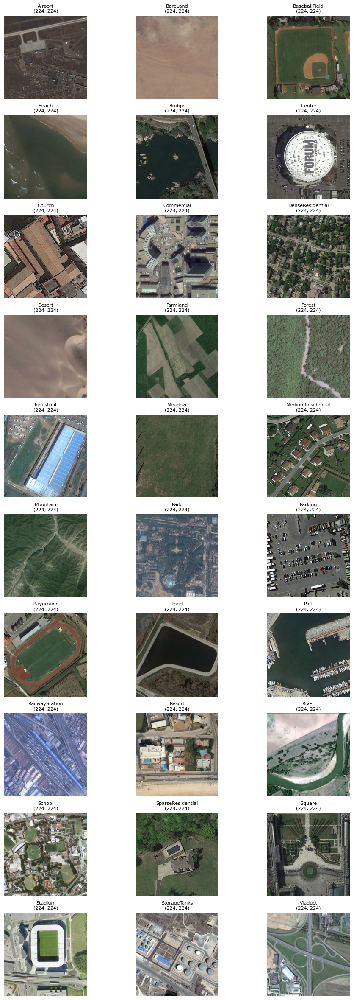

In [10]:
import math

# Define directory for test data
path_test = f"{path_output}/dataset/test"

# Loop into each class
img_list = []
class_list = []
for i, class_ in enumerate(list_files(path_test)):
    path_class = f"{path_test}/{class_}"
    path_img = f"{path_class}/{list_files(path_class)[0]}"
    img = Image.open(path_img)
    compressed_img = img.resize((224, 224))  # Compress image to desired size
    img_list.append(compressed_img)
    class_list.append(class_)

# Determine the number of images
num_images = len(img_list)

# Calculate the number of rows and columns for the subplot grid
num_cols = min(num_images, 3)
num_rows = math.ceil(num_images / num_cols)

# Adjust the aspect ratio of subplots for reduced horizontal spacing
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, num_rows*3))

# Iterate through each image and its corresponding class
for i, (img, class_name) in enumerate(zip(img_list, class_list)):
    # Calculate the current row and column index for the subplot
    row_idx = i // num_cols
    col_idx = i % num_cols

    # Plot the image
    ax = axs[row_idx, col_idx] if num_rows > 1 else axs[col_idx]
    ax.imshow(img)
    ax.axis('off')

    # Set the title as the corresponding class
    ax.set_title(f"{class_name}\n{img.size}", fontsize=8)  # Adjust the fontsize as needed

# Remove empty subplots if the number of images is not a multiple of num_cols
if num_images % num_cols != 0:
    for i in range(num_images, num_rows * num_cols):
        ax = axs.flatten()[i]
        ax.axis('off')

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.004, hspace=0.2)

# Show the plot
plt.show()


In this part, we perform transformation of the dataset. The succeeding code in this section applies the transformations to each sample in the dataset and returns the transformed data. This prepared dataset can then be loaded into the model for training, validation, or testing purposes.

In [11]:
# Set the directory path for the training dataset
train_dir = f"{path_output}/dataset/train"

# Define the transformations to be applied to the dataset
data_transforms = transforms.Compose([
    transforms.Resize(size=(224, 224)),  # Resize the images to the specified size
    transforms.ToTensor()  # Convert the images to tensors
])

# Load the training dataset using the specified transformations
train_data = datasets.ImageFolder(root=train_dir, transform=data_transforms)

# Compute the means and standard deviations for normalization
# Stack all the images in the dataset into a tensor
imgs = torch.stack([img_t for img_t, _ in train_data], dim=3)

# Calculate the means for each channel (dimension) of the images
means = imgs.view(3, -1).mean(dim=1).numpy()

# Calculate the standard deviations for each channel (dimension) of the images
stds = imgs.view(3, -1).std(dim=1).numpy()

# Print the computed means and standard deviations
print(f'Means:           {means}')
print(f'Std. Deviations: {stds}')

Means:           [0.3993528  0.4104297  0.36928317]
Std. Deviations: [0.20810837 0.18451604 0.18224896]


In [12]:
# Define the transformations to be applied to the training, validation, and test data
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(size=(224,224)),  # Resize the images to (224, 224)
        transforms.RandomHorizontalFlip(p=0.6),  # Apply random horizontal flipping with a probability of 0.6
        transforms.RandomPerspective(p=0.5),  # Apply random perspective transformation with a probability of 0.5
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),  # Adjust color jitter with specified parameters
        transforms.ToTensor(),  # Convert the images to tensors
        transforms.Normalize(means, stds)  # Normalize the images using the specified means and standard deviations
    ]),
    'validation': transforms.Compose([
        transforms.Resize(size=(224,224)),  # Resize the images to (224, 224)
        transforms.ToTensor(),  # Convert the images to tensors
        transforms.Normalize(means, stds)  # Normalize the images using the specified means and standard deviations
    ]),
    'test': transforms.Compose([
        transforms.Resize(size=(224,224)),  # Resize the images to (224, 224)
        transforms.ToTensor(),  # Convert the images to tensors
        transforms.Normalize(means, stds)  # Normalize the images using the specified means and standard deviations
    ])
}

# Set the directory path for the dataset
data_dir = f"{path_output}/dataset/"

# Load the image data using the ImageFolder dataset class
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'validation', 'test']}

# Create dataloaders for each data split (train, validation, test)
dataloaders = {x: DataLoader(image_datasets[x], batch_size=4, shuffle=True) for x in ['train', 'validation', 'test']}

# Calculate the size of each dataset (train, validation, test)
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation', 'test']}

# Get the class names from the 'train' dataset
class_names = image_datasets['train'].classes

In [13]:
from pathlib import Path

# for plotting transforms
plt.rcParams["savefig.bbox"] = 'tight'
img_class = f"scene images/dataset/test/Airport"
image_path = f"{img_class}/{list_files(img_class)[8]}"
orig_img = Image.open(Path(image_path))

def plot(imgs, with_orig=True, row_title=None, **imshow_kwargs):
    if not isinstance(imgs[0], list):
        # make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False)
    for row_idx, row in enumerate(imgs):
        row = [orig_img] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()

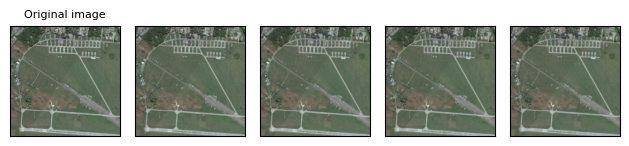

In [14]:
resized_imgs = [transforms.Resize(size=(224,224))(orig_img) for size in (30, 50, 100, orig_img.size)]
plot(resized_imgs)

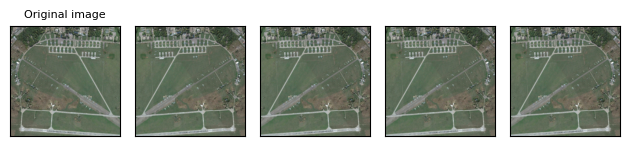

In [15]:
hflipper = transforms.RandomHorizontalFlip(p=0.6)
transformed_imgs = [hflipper(orig_img) for _ in range(4)]
plot(transformed_imgs)

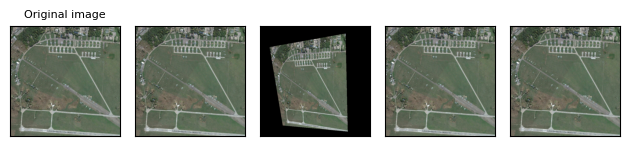

In [16]:
perspective = transforms.RandomPerspective(p=0.5)
transformed_imgs = [perspective(orig_img) for _ in range(4)]
plot(transformed_imgs)

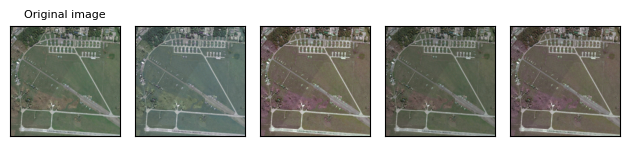

In [17]:
jitter = transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2)
transformed_imgs = [jitter(orig_img) for _ in range(4)]
plot(transformed_imgs)

# Model Training, Validation, and Testing

After the dataset is partitioned, transformed, and loaded, we will now prepare the code for training and validating the model. In this case, the type of CNN model to be used is a RESNET-34 model. 

ResNet-34 is a state-of-the-art CNN with 34 layers, known for its strong performance in image classification. ResNet-34 has undergone pre-training on the expansive ImageNet dataset, which encompasses over 100,000 images distributed across a diverse range of 200 distinct classes. It utilizes residual connections to train deep networks effectively. ResNet-34 strikes a balance between model complexity and efficiency, making it popular for various computer vision tasks. It consists of multiple stages with residual blocks, gradually capturing complex features. ResNet-34 has achieved excellent results on ImageNet and is widely used for transfer learning. Its residual connections enable training deep networks and have influenced subsequent advancements in CNN architectures.

In the training process for the aerial scene classification application described here, modifications are made to the classifier layers of the ResNet-34 model. The original fully connected layer is replaced with a new sequential architecture, consisting of a linear layer with 512 input features, followed by a ReLU activation function, a dropout layer with a rate of 0.4, and another linear layer to match the number of output classes.

Next, specific parameters are selected for fine-tuning. The names of the desired parameters are stored in a list called "params_to_update". By iterating through the named parameters of the model, if a parameter matches any of the names in "params_to_update", it is set to require gradients for optimization, and the parameter is added to the "params" list.

Additionally, the last fully connected layer is replaced once again to ensure it matches the number of output classes. The entire model is then transferred to the designated device, such as a GPU, if available, using the "to()" method.

A cross-entropy loss function is chosen as the criterion for optimization. The parameters of the last convolutional block and the classifier are optimized using the Adam optimizer with a learning rate of 0.0001.

Finally, the model is trained using the "train_model" function for a specified number of epochs, which in this case is set to 5. The training involves iteratively updating the model's parameters based on the calculated loss, optimizing the model towards achieving better performance on the given task. Training time took around 2 hours.

In [18]:
def train_model(model, criterion, optimizer, num_epochs=25):
    """
    Train the model with the given criterion and optimizer for a
    specified number of epochs.

    Args:
        model (torch.nn.Module): The model to be trained.
        criterion (torch.nn.Module): The loss function to optimize.
        optimizer (torch.optim.Optimizer): The optimizer for updating
        model parameters.
        num_epochs (int, optional): The number of training epochs.
        Defaults to 25.

    Returns:
        torch.nn.Module: The trained model.

    """
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
           
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # deep copy the model
            if phase == 'validation' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [19]:
# Load pre-trained ResNet18 model
model =  torchvision.models.resnet34(weights='IMAGENET1K_V1')

In [20]:
num_classes = len(class_names)

# Modify the classifier layers
num_features = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_features, 512),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(512, num_classes)
)

# Setting parameters to fine-tune
params_to_update = ['layer4.0.conv1.weight', 'layer4.0.conv1.bias',
                    'layer4.0.conv2.weight', 'layer4.0.conv2.bias',
                    'layer4.1.conv1.weight', 'layer4.1.conv1.bias',
                    'layer4.1.conv2.weight', 'layer4.1.conv2.bias',
                    'fc.weight', 'fc.bias']

# Store parameters in a list
params = []
for name, param in model.named_parameters():
    for parameter in params_to_update:
        if parameter in name:
            param.requires_grad = True
            params.append(param)

# Replace last fully connected layer to match the number of output classes
model.fc = nn.Linear(512, num_classes)

In [21]:
model = model.to(device)

# set the loss function
criterion = nn.CrossEntropyLoss()

# the parameters of the last concolutional block and classifier are being optimized
optimizer_model = optim.Adam(params, lr=0.0001)

## Model Training

In [ ]:
model = train_model(model, 
                    criterion, 
                    optimizer_model, 
                    num_epochs=5)

Epoch 0/4
----------
train Loss: 1.8758 Acc: 0.5553
validation Loss: 0.5290 Acc: 0.8535

Epoch 1/4
----------


In [31]:
PATH = "NetSensing.pth"
torch.save(model.state_dict(), PATH)

## Model Evaluation

Our Resnet-34 model showed a very good accuracy. This high accuracy is also a requirement when extracting valuable information from the explainability of the model. A low model accuracy will result to unreliable insights when we use LIME later on.

In [14]:
def evaluate(model, test_loader):
    """
    Evaluate the model on the test dataset and print the test accuracy.

    Args:
        model (torch.nn.Module): The trained model to be evaluated.
        test_loader (torch.utils.data.DataLoader): The data loader for
        the test dataset.

    """
    correct = 0
    total = 0

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            outputs = model(imgs)
            _, predicted = torch.max(outputs, dim=1)
            total += labels.shape[0]
            correct += int((predicted == labels).sum())

    print("Test Accuracy: {:.4f}".format(correct / total))

In [30]:
evaluate(model, dataloaders['test'])

Test Accuracy: 0.9376


## Model Testing

In [15]:
def imageshow(img):
    """
    Display an image.

    Parameters:
        img (torch.Tensor): The image tensor to be displayed.
        Should be normalized between -1 and 1.

    Returns:
        None
    """
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def visualize_preds(model, images, labels):
    """
    Visualize the predictions made by a model on a batch of images.

    Parameters:
        model (torch.nn.Module): The trained model used for prediction.
        images (torch.Tensor): The input images as a tensor.
        labels (torch.Tensor): The true labels for the images.

    Returns:
        None
    """
    # get batch of images from the test DataLoader  
    images = images.to(device)
    labels = labels.to(device)

    # show all images as one image grid
    imageshow(torchvision.utils.make_grid(images.cpu()))
   
    # show the real labels  
    print('Real labels: ', ' '.join('%5s' % classes[labels[j]] 
                               for j in range(4)))

    outputs = model(images)
    _, predicted = torch.max(outputs, 1)
    
    # show the predicted labels 
    print('Predicted: ', ' '.join('%5s' % classes[predicted[j]] 
                              for j in range(4)))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


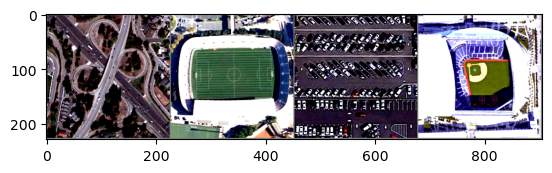

Real labels:  Viaduct Stadium Parking Stadium
Predicted:  Viaduct Stadium Parking Stadium


In [37]:
images, labels = next(iter(dataloaders['test']))

visualize_preds(model, images, labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


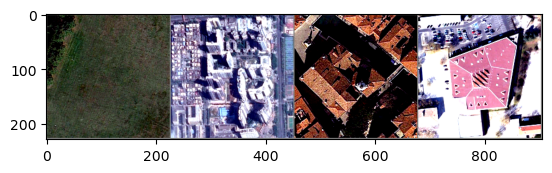

Real labels:  Meadow Commercial Church Center
Predicted:  Meadow Commercial Church Center


In [38]:
images, labels = next(iter(dataloaders['test']))

visualize_preds(model, images, labels)

Because our model has high accuracy, we are able to correctly predict all of the classification of the images in the two instances as shown above.

# LIME in Action

LIME, known as Local Interpretable Model-agnostic Explanations, is a highly favored technique in Explainable AI that aims to gain high-level understanding of the inner workings of deep learning models. It is widely employed for generating interpretable explanations at the local level. LIME is a versatile method that can be used for solving both regression and classification problems, and it is applicable to various types of datasets, including structured data as well as unstructured data such as text and images.

For image classifiers, LIME produces a collection of images by manipulating the input image through the division of interpretable components known as super pixels. This process yields a probability of belonging for each of these modified instances. By analyzing the classification of these perturbed data, LIME generates a visual explanation that highlights a specific region in the input image. This region represents the aspects the model focused on while making its prediction.

If you want to learn more about LIME, you can read more about it in the paper entitled, "'Why Should I Trust You?': Explaining the Predictions of Any Classifier" that can be found in this link: https://arxiv.org/abs/1602.04938

Let us now proceed to getting LIME in action.

From the above preparations, we are now ready to explain our Resnet-34 model above using LIME.

To do this, we need to choose an image first and then do transformations in this image in preparation for model prediction. We will be first using images from our test dataset.

Using LIME, our goal is to identify which features or part of this image had caused the model to decide to classify this as an 'Airport'.

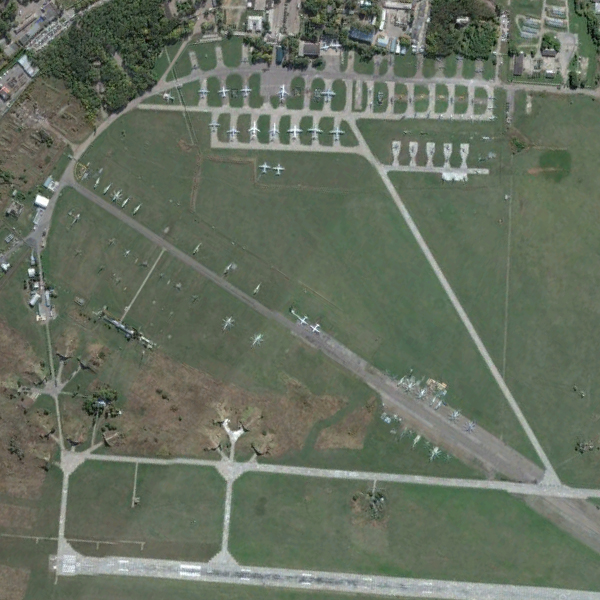

In [87]:
img_class = f"scene images/dataset/test/Airport"
img_fname = f"{img_class}/{list_files(img_class)[8]}"
test_image = Image.open(img_fname)
test_image

Here is a function to extract prediction from the model.

In [88]:
import torch.nn.functional as F

def predict_image(test_image, model, show_image=False):
    """
    Predicts the class of a test image using a trained model and
    calculates the similarity between the test image
    and the training images of the predicted class.

    Args:
        test_image (PIL.Image): The test image to predict the class for.
        model (torch.nn.Module): The trained model to use for prediction.
        show_image (bool, optional): Whether to display the test image
        along with its predicted class. Default is False.

    Returns:
        tuple or None: If `show_image` is False, returns a tuple
        containing the predicted class and the similarity 
        scores. If `show_image` is True, displays the test image with
        its predicted class and similarity score, and returns None.
    """
    # Preprocess the image
    test_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ])
    test_img = test_transform(test_image)
    test_img = test_img.unsqueeze(0)
    with torch.no_grad():
        test_img = test_img.to(device)
        output = model(test_img)
        _, predicted = torch.max(output, dim=1)
    
    pclass = classes[predicted]
        
    # Get the features of the trained images
    path_train = f"{path_output}/dataset/train/{pclass}/"
    train_images = list_files(path_train)
    features = []
    for img_path in train_images:
        path_img = f"{path_train}/{img_path}"
        img = Image.open(path_img)
        img = test_transform(img)
        img = img.unsqueeze(0)
        img = img.to(device)
        with torch.no_grad():
            feature = model(img)
            feature = feature.flatten()
            features.append(feature)

    # Get the feature of the test image
    with torch.no_grad():
        test_feature = model(test_img)
        test_feature = test_feature.flatten()
    
    similarities = F.cosine_similarity(test_feature.unsqueeze(0),
                                       torch.stack(features),
                                       dim=1)
    
    if show_image == True:
        # Create a figure and subplots
        fig, ax = plt.subplots(1, 1, figsize=(6, 6))

        # Plot the image
        ax.imshow(test_image)
        ax.axis('off')

        # Set the title as the corresponding class
        ax.set_title(f"{pclass} ({similarities[0].item()*100:.4f} %)")
    else:
        return pclass, similarities

As shown, the image correctly predicted as airport has a similarity measure of about 96.34% to our train dataset for the 'Airport' class.

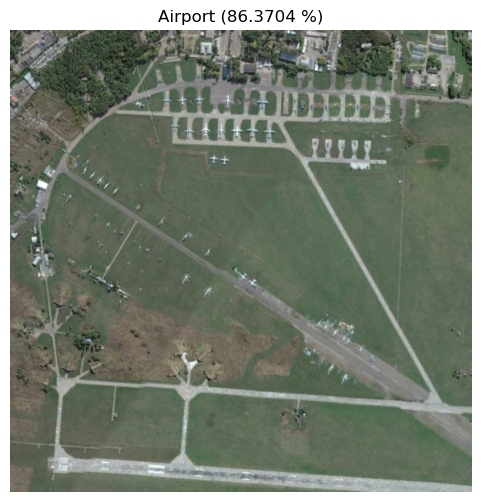

In [89]:
predict_image(test_image, model, show_image=True)

The provided code below performs several operations on an input test image using a pre-trained ResNet model and the LimeImageExplainer for explanation generation.

First, the image is preprocessed by resizing it to (224, 224) pixels, converting it to a tensor, and applying normalization. The preprocessed image is then passed through the ResNet model to obtain the output predictions. The output tensor is converted to a numpy array for further processing. The input tensor is reshaped into a 2D color image format to be used as input for Lime explanations. Lime explanations are generated by calling the explain_instance() method with the input image, the ResNet model as a classifier function, and other parameters. The resulting explanation is stored for further analysis or visualization.

In [90]:
def explainer(test_img):
    # Preprocess the image
    test_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ])
    test_img = test_transform(test_img)
    input_tensor = test_img.unsqueeze(0).to(device)

    # Perform the forward pass on the ResNet model
    with torch.no_grad():
        output = model(input_tensor)

    # Convert the PyTorch output tensor to a numpy array
    output_np = output.cpu().numpy()

    # Reshape the input tensor to a 2D color image format
    input_2d = np.transpose(input_tensor.squeeze().cpu().numpy(), (1, 2, 0))

    # Perform Lime explanations
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(input_2d,
                                     classifier_fn=(lambda imgs:
                                                    model(torch.Tensor
                                                          (np.transpose
                                                           (imgs, (0, 3, 1, 2)))
                                                          .to(device))
                                                    .detach()
                                                    .cpu().numpy()),
                                     top_labels=5,
                                     hide_color=0,
                                     num_samples=1000)
    return exp

We can also visualize the various explanation segments created by the LIME algorithm as shown in the figure below.

In [93]:
exp = explainer(test_image)

  0%|          | 0/1000 [00:00<?, ?it/s]

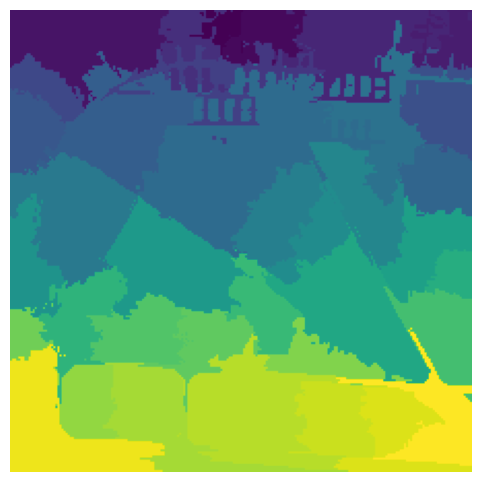

In [94]:
fig = plt.figure(figsize=(6, 6))
plt.imshow(exp.segments)
plt.axis('off')
plt.show()

Next, we will leverage the top segments or super pixels to identify the specific region of interest within the image that the model relied on to make its prediction. By analyzing these selected segments, we can gain insights into the most influential areas that contributed to the model's decision-making process.

In [142]:
def generate_prediction_sample(exp, exp_class, weight=0.1, show_positive=True, hide_background=True):
    """
    Method to display and highlight super-pixels used by the black-box model to make predictions
    """
    
    image, mask = exp.get_image_and_mask(exp_class,
                                     positive_only=show_positive,
                                     num_features=10,
                                     hide_rest=hide_background,
                                     min_weight=weight)
    
    # Change the color of the boundary and outside area to gray
    boundaries = mark_boundaries(image, mask, color=(0, 0, 0), outline_color=(0.5, 0.5, 0.5))  # Set color=(0, 0, 0) for black, and outline_color=(0.5, 0.5, 0.5) for gray
    gray_outside = np.where(boundaries == 0, 0.5, boundaries)  # Set boundary and outside area to gray (0.5), and keep other values
    
    fig = plt.figure(figsize=(6, 6))
    plt.imshow(gray_outside)
    plt.axis('off')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


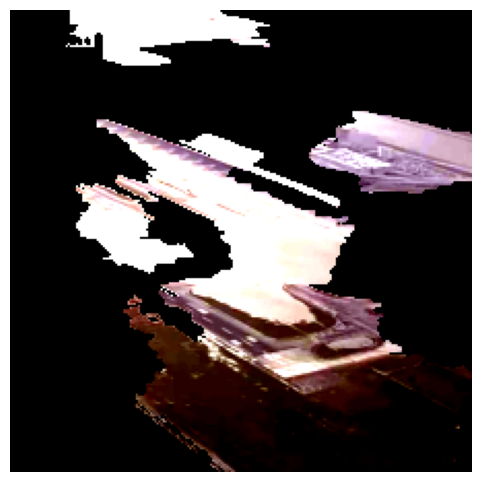

In [121]:
from skimage.segmentation import mark_boundaries

generate_prediction_sample(exp, exp.top_labels[0], show_positive=True,
                           hide_background=True)

As we can see from the above figure, the model is able to classify the image based on the above regions. We can notice that the model classifies the airport not only based on the regions where the airplanes are but also those region where the runways are.

On the other hand, in the image below, highlighted in green areas are the super-pixel picked up by LIME to predict the output as Airport. These areas are also called as positive super-pixels.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


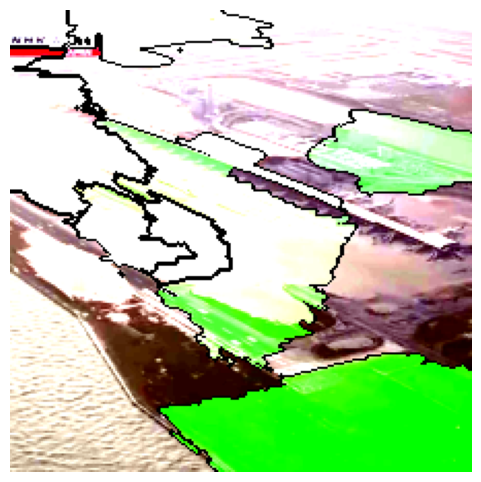

In [122]:
generate_prediction_sample(exp, exp.top_labels[0], show_positive=False, hide_background=False)

We can further improve the above images to generate better insights.

We can also use a heatmap to highlight the regions in the image that the model used to assign the highest weights.

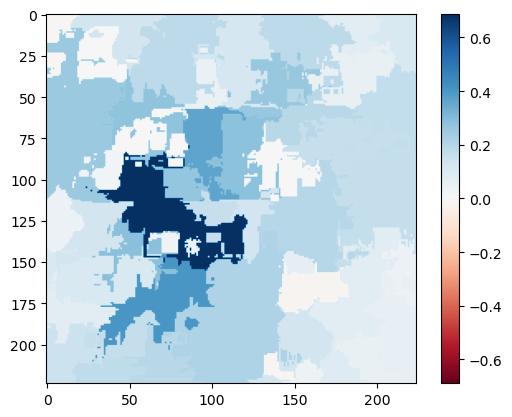

In [153]:
def explanation_heatmap(exp, exp_class):
    """
    Using heat-map to highlight the importance of each super-pixel
    for the model prediction
    """
    dict_heatmap = dict(exp.local_exp[exp_class])
    heatmap = np.vectorize(dict_heatmap.get)(exp.segments)
    plt.imshow(heatmap, cmap='RdBu', vmin=-heatmap.max(), vmax=heatmap.max())
    plt.colorbar()
    plt.show()

explanation_heatmap(exp, exp.top_labels[0])

For demo:

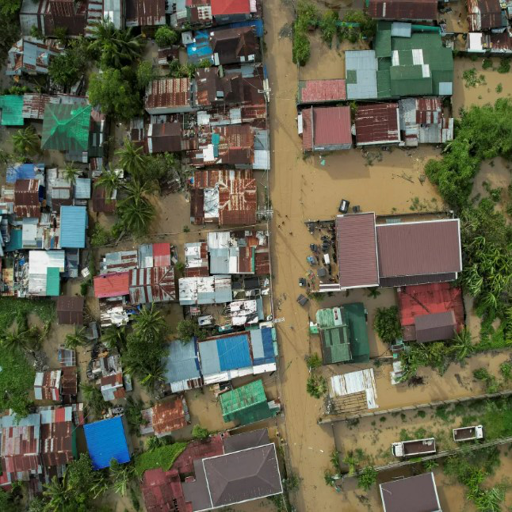

In [157]:
img_fname = "flooded_residential.jpg"
test_image = Image.open(img_fname).resize([512, 512])
test_image

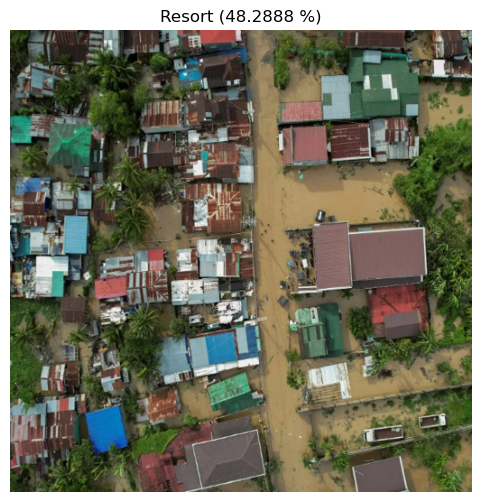

In [158]:
predict_image(test_image, model, show_image=True)

In [159]:
exp = explainer(test_image)

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


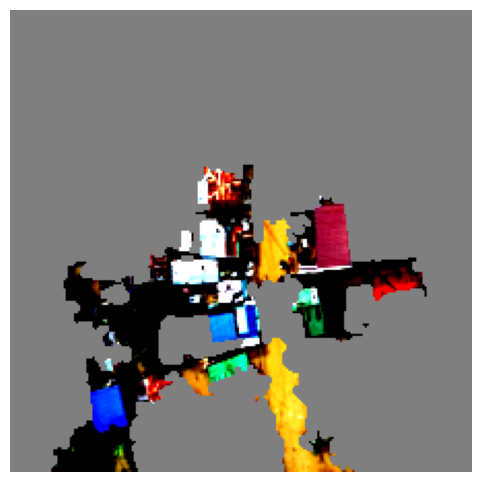

In [160]:
generate_prediction_sample(exp, exp.top_labels[0], show_positive=True, hide_background=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


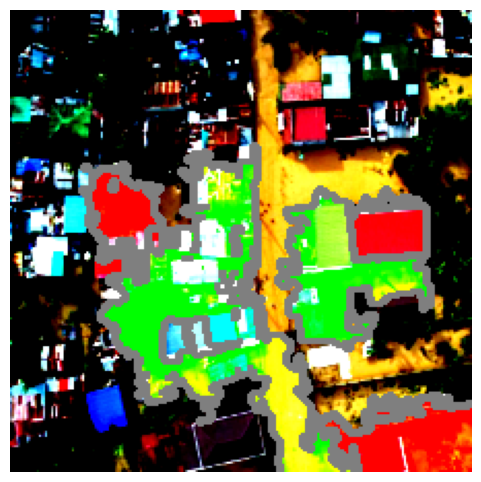

In [161]:
generate_prediction_sample(exp, exp.top_labels[0], show_positive=False, hide_background=False)

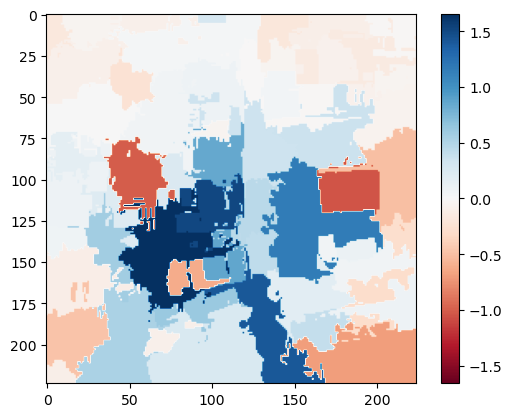

In [162]:
explanation_heatmap(exp, exp.top_labels[0])

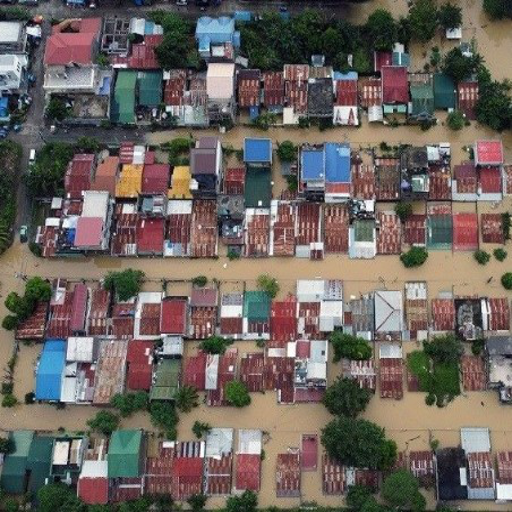

In [124]:
img_fname = "flooded_residential2.jpg"
test_image2 = Image.open(img_fname).resize([512, 512])
test_image2

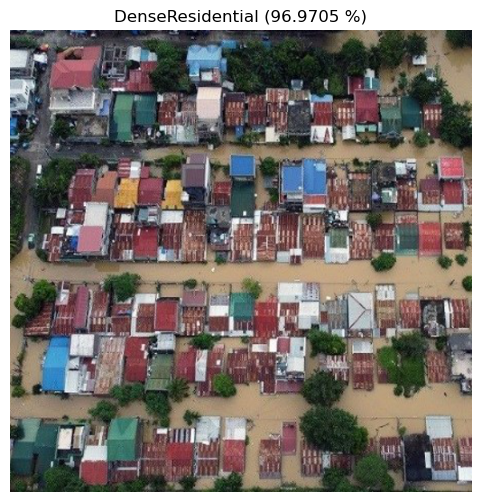

In [125]:
predict_image(test_image2, model, show_image=True)

In [126]:
exp = explainer(test_image2)

  0%|          | 0/1000 [00:00<?, ?it/s]

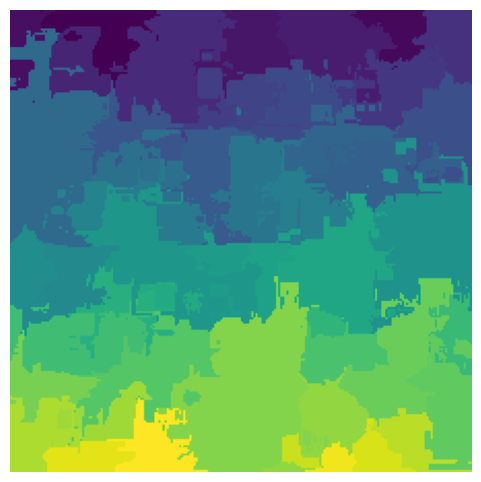

In [111]:
fig = plt.figure(figsize=(6, 6))
plt.imshow(exp.segments)
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


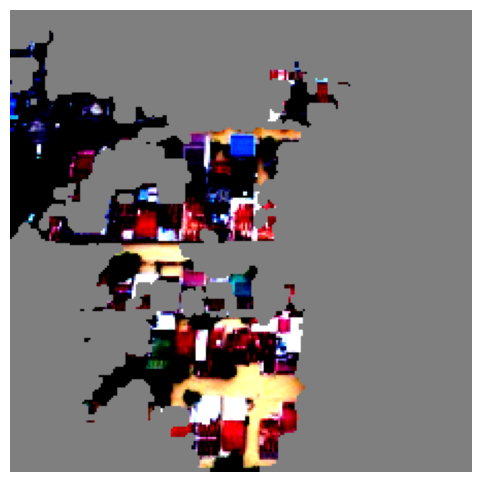

In [143]:
generate_prediction_sample(exp, exp.top_labels[0], show_positive=True, hide_background=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


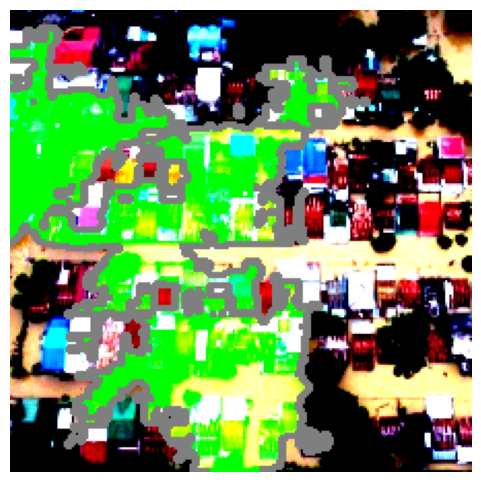

In [144]:
generate_prediction_sample(exp, exp.top_labels[0], show_positive=False, hide_background=False)

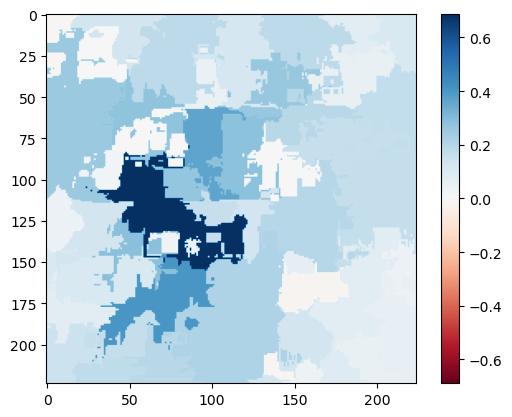

In [145]:
explanation_heatmap(exp, exp.top_labels[0])

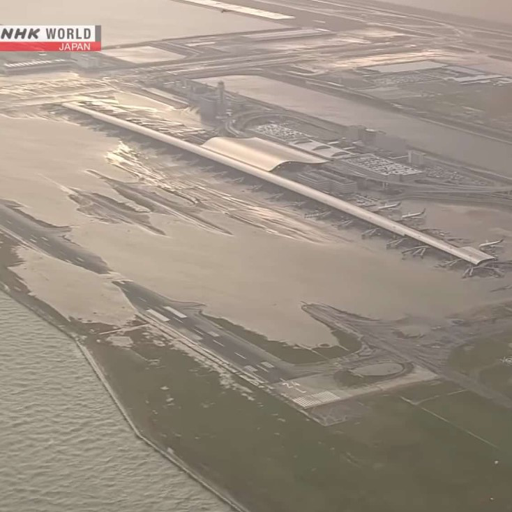

In [115]:
img_fname = "flooded_airport.jpg"
test_image2 = Image.open(img_fname).resize([512, 512])
test_image2

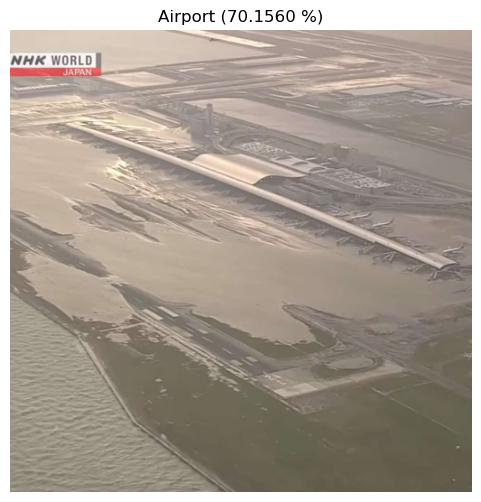

In [116]:
predict_image(test_image2, model, show_image=True)

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


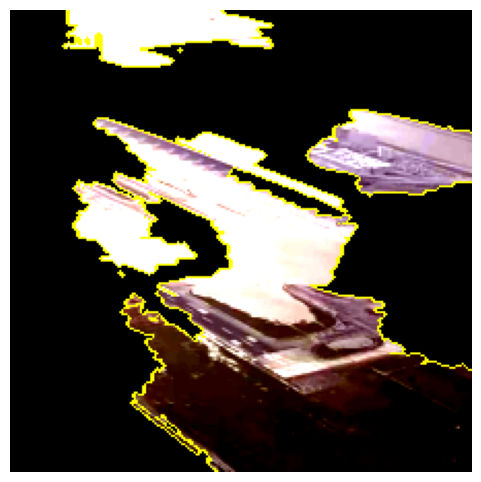

In [117]:
exp = explainer(test_image2)
generate_prediction_sample(exp, exp.top_labels[0], show_positive=True, hide_background=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


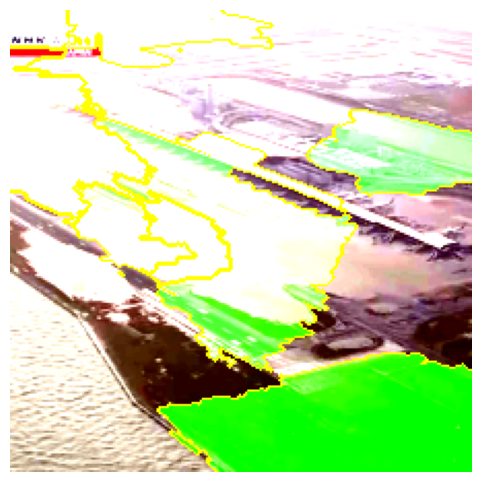

In [118]:
generate_prediction_sample(exp, exp.top_labels[0], show_positive=False, hide_background=False)

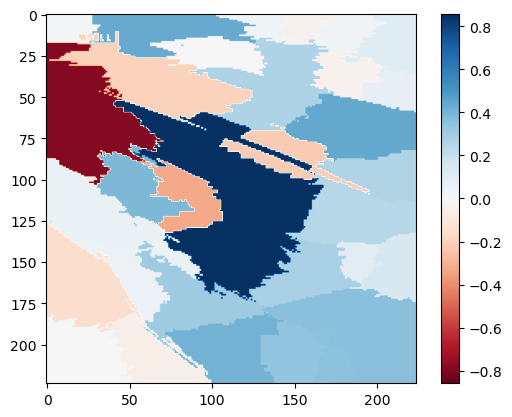

In [119]:
explanation_heatmap(exp, exp.top_labels[0])

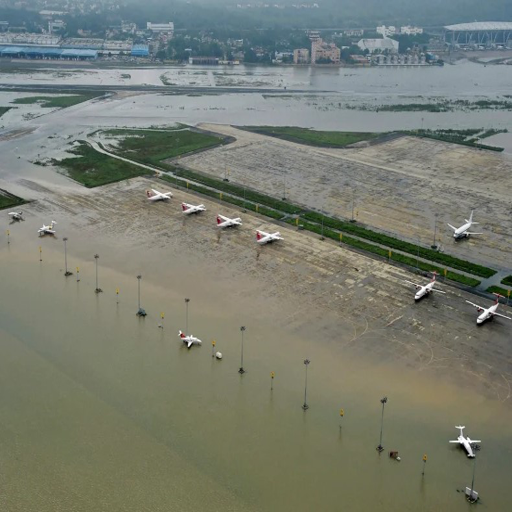

In [148]:
img_fname = "flooded_airport2.jpg"
flooded_airport = Image.open(img_fname).resize([512, 512])
flooded_airport

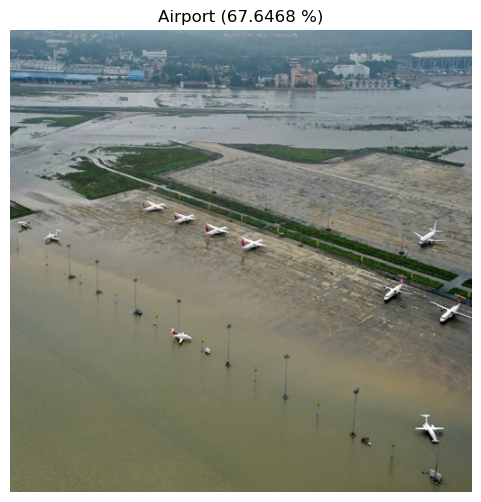

In [149]:
predict_image(flooded_airport, model, show_image=True)

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


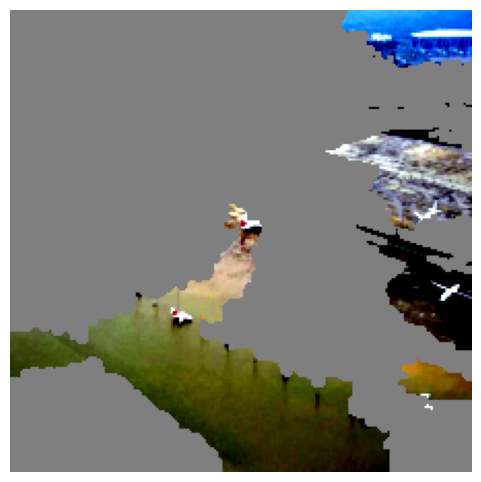

In [150]:
exp2 = explainer(flooded_airport)
generate_prediction_sample(exp2, exp2.top_labels[0], show_positive=True, hide_background=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


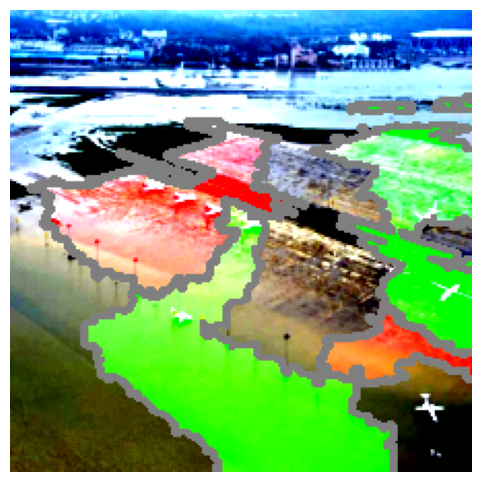

In [156]:
generate_prediction_sample(exp2, exp2.top_labels[0], show_positive=False, hide_background=False)

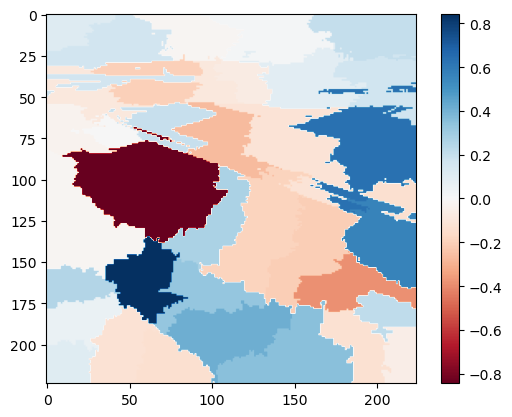

In [154]:
explanation_heatmap(exp2, exp2.top_labels[0])

# Summary

In summary, we can see from this article how LIME is capable to help generate valuable insights in the explainability of an image classification model. This technique can be used in any application requiring not only a model with high accuracy but also a model whose predictions are easily interpretable.

Thank you for reading! I hope you learned something interesting! :)

# References

- Velázquez, T. M. G., & Azuela, J. H. S. (2021). New Explainability Method based on the Classification of Useful Regions in an Image. Comp. y Sist., 25(4). doi:10.13053/cys-25-4-4049
- Bhattacharya, A. (2022, August 15). How to Explain Image Classifiers Using LIME. Retrieved from https://towardsdatascience.com/how-to-explain-image-classifiers-using-lime-e364097335b4
- Xia, G., Hu, J., Hu, F., Shi, B., Bai, X., Zhong, Y., & Zhang, L. (2017). AID: A Benchmark Dataset for Performance Evaluation of Aerial Scene Classification. IEEE Transactions on Geoscience and Remote Sensing, 55(7), 3965-3981.